In [238]:
from abc import ABC, abstractclassmethod
from typing import Dict, List, Tuple, Optional
from collections.abc import Callable, Iterable
from dataclasses import dataclass, field
from functools import partial


from random import random, shuffle
from glob import glob

import numpy as np
import pandas as pd
import statistics as stats

from tqdm import tqdm
import plotly.express as px
import plotly.graph_objects as go
from matplotlib import pyplot as plt
from sklearn.neural_network import MLPRegressor as reg

In [221]:
@dataclass
class Model(ABC):
    """Base Representation of a Machine Learning Model."""
    loss: Optional[Callable[[np.ndarray, np.ndarray], np.ndarray]]
    learning_rate: float 
    epochs: int
    eval_step: int
    early_stop: bool
    
    @abstractclassmethod
    def predict(self, X: np.ndarray) -> None:
        """Predicts the out come of Matrix X."""
        pass
        
    @abstractclassmethod
    def update_weights(self, X: np.ndarray, y: np.ndarray) -> None:
        """Updates the weights of the model after one step or epoch."""
        pass
    
    @abstractclassmethod
    def fit(self, X: np.ndarray, y: np.ndarray ) -> None:
        """trains the model using the vector features X and labels Y."""
        pass
    
    @abstractclassmethod
    def save_hist(self, X: np.ndarray, y: np.ndarray, i: int) -> None:
        """Saves the parameters of the model in between updates of training."""
        pass
    
    def plot_history(self, keys: Iterable) -> go.Figure:
        """Plots the keys saved in self.hist for each epoch."""
        fig = make_subplots(specs=[[{"secondary_y": True}]])
        for key in keys:
            fig.add_trace(go.Scatter(x=np.arange(stop=self.epochs,),
                                     y=self.hist[key], name=key))
        return fig

@dataclass   
class Scaler():
    mean: float
    std: float
    def set_standard_scaler(self, X: np.ndarray) -> np.ndarray:
        """Standardize features by removing the mean and scaling to unit variance and save it for prediction time."""
        self.mean = np.mean(X, axis=0)
        self.std = np.std(X, axis=0)
        standard = (X - self.mean) / self.std

        return standard

    def get_standard_scaler(self, X: np.ndarray) -> np.ndarray:
        """Standardize features by removing the mean of training set and scaling to unit variance of training set."""
        standard = (X - self.mean) / self.std

        return standard

def load_csv(path: str) -> Dict[str, np.ndarray]:
    """Loads every csv file in the path."""
    dataloader = {file_path.split("/")[-1].split(".")[0]: pd.read_csv(file_path, header=None, sep=" ") for file_path in glob(path+"*.csv")}
    return dataloader

# loss functions
def mse(y: np.ndarray,  y_pred: np.ndarray, derivative=False) -> np.ndarray:
    """Returns the mean square error between to vectors"""
    y = y.flatten()
    y_pred = y_pred.flatten()
    return  2*(y_pred - y) if derivative else (y_pred - y)**2


def mae(y: np.ndarray, y_pred: np.ndarray, derivative=False) -> np.ndarray:
    """Returns mean absolute error between to vectors"""
    y = y.flatten()
    y_pred = y_pred.flatten()
    return Exception("MAE isn't differentiable") if derivative else abs(y_pred - y)

def rmse(y: np.ndarray, y_pred: np.ndarray, derivative=False) -> np.ndarray:
    y = y.flatten()
    y_pred = y_pred.flatten()
    return  (y_pred - y)/np.sqrt((y_pred - y)**2) if derivative else np.sqrt((y_pred - y)**2)

def calc_loss(X, y, model, loss):
    pred = model.predict(X)
    return np.mean(loss(pred,y))
    
def plot(X: pd.DataFrame, y: pd.DataFrame, model: Optional[Model]= None) -> go.Figure:
    """Ploting all the (X, y, plot_name) on the same figure."""
    mesh_size = .02
    margin = 0
    
    # Create a mesh grid on which we will run our model
    x_min, x_max = X[:,0].min() - margin, X[:,0].max() + margin
    y_min, y_max =  X[:,1].min() - margin, X[:,1].max() + margin
    xrange = np.arange(x_min, x_max, mesh_size)
    yrange = np.arange(y_min, y_max, mesh_size)
    xx, yy = np.meshgrid(xrange, yrange)
    
    if model == None:
        model = golden_standard(X, y)
    
    pred = model.predict(np.c_[xx.ravel(), yy.ravel()])
    pred = pred.reshape(xx.shape)
    
    
    # Generate the plot
    fig = px.scatter_3d(x=X[:,0], y=X[:,1], z=y[0])
    fig.update_traces(marker=dict(size=5))
    fig.add_traces(go.Surface(x=xrange, y=yrange, z=pred, name='pred_surface'))
    return fig

def evaluate_fitting(dataloader, model, loss):
    print("Training fitting ...")
    
    scaler = Scaler(0,0)
    X_train = dataloader["X_train"].to_numpy()
    X_train = scaler.set_standard_scaler(X_train)
    # X_train = X_train.reshape((dataloader["X_train"].shape[0],1,dataloader["X_train"].shape[1]))
    # X_train = make_polynomial_data(degree=2,X=X_train)
    
    model.fit(X=X_train, y=dataloader["Y_train"].to_numpy())
    
    print("loss:", calc_loss(X=X_train, y=dataloader["Y_train"].to_numpy(), model=model, loss=loss))
    plot(X=X_train, y=dataloader["Y_train"], model=model).show()
    print("Test fitting ...")
    X_test = dataloader["X_test"].to_numpy()
    X_test = scaler.get_standard_scaler(X_test)
    # X_test = X_test.reshape((dataloader["X_test"].shape[0],1,dataloader["X_test"].shape[1]))
    # X_test = make_polynomial_data(degree=2,X=X_test)
    print("loss:", calc_loss(X=X_test, y=dataloader["Y_test"].to_numpy(), model=model, loss=loss))
    plot(X=X_test, y=dataloader["Y_test"], model=model).show()

# activation function and its derivative
def tanh(x: np.ndarray, derivative=False) -> np.ndarray:
    # x = x.reshape((x.shape[0], -1))
    return 1-np.tanh(x)**2 if derivative else np.tanh(x)

def sigmoid(x: np.ndarray, derivative=False) -> np.ndarray:
    return  sigmoid(x) * (1. - sigmoid(x)) if derivative else 1. / (1. + np.exp(-x))
    
def relu(x: np.ndarray, derivative=False) -> np.ndarray:
    if ~derivative:
        return np.maximum(0, x)
    x[x<=0] = 0
    x[x>0] = 1
    return x

def linear_activation(x: np.ndarray, derivative=False, a=10) -> np.ndarray:
    return (5*x**4)+(4*x**3)+(3*x**2)+x+1 if derivative else np.mean(x**5+x**4+x**3+x**2+x+1)
                
@dataclass
class NN(Model):
    """Simple MLP Impelementation"""
    layer_sizes: Tuple[int]
    activation_functions: List[Callable]
    
    def zero_grads(self):
        new_dict ={}
        for i in range(self.num_layers):
            new_dict[f"W{i+1}"] = self.parameters[f"W{i+1}"]
            new_dict[f"b{i+1}"] = self.parameters[f"b{i+1}"]
            
        # self.parameters = dict((k,) for k in [f"W{i+1}" for i in range(self.num_layers)])
        self.parameters = new_dict
    
    def random_initializers(self, debug: bool=False) -> None:
        """Make a random start for weights and bias"""
        np.random.seed(1)
        self.num_layers = len(self.layer_sizes)-1
        self.parameters = {}
        self.update = []
        
        for i in range(self.num_layers):
            self.parameters[f"W{i+1}"]= np.random.randn(self.layer_sizes[i+1], self.layer_sizes[i]) * np.sqrt(1. / self.layer_sizes[i+1])
            self.parameters[f"b{i+1}"]= np.zeros((self.layer_sizes[i+1],1))
            
        if debug:
            [print(f"{key}= {value.shape}", end=", ") for key, value in self.parameters.items()]
            print()
            
    def forward(self, X: np.ndarray, debug: bool =False) -> np.ndarray:
        self.parameters['A0'] = X.flatten().reshape(X.shape[0],-1)
        for i in range(self.num_layers):
            self.parameters[f"Z{i+1}"] = self.parameters[f"W{i+1}"] @ self.parameters[f"A{i}"] + self.parameters[f"b{i+1}"]
            self.parameters[f"A{i+1}"] = self.activation_functions[i](self.parameters[f"Z{i+1}"])
            
            if debug:
                print(f'Z{i+1} = self.parameters[f"W{i+1}"] @ self.parameters[f"A{i}"] + self.parameters[f"b{i+1}"]')
                print(f'{self.parameters[f"Z{i+1}"].shape}   =  {self.parameters[f"W{i+1}"].shape} x {self.parameters[f"A{i}"].shape} + {self.parameters[f"b{i+1}"].shape}')
                print(f'A{i+1} = self.activation_functions[{i}](self.parameters[Z{i+1}])')
                print(f'{self.parameters[f"A{i+1}"].shape}   =  {self.parameters[f"Z{i+1}"].shape}')
                
        return self.parameters[f"A{i+1}"]

    def backward(self, loss_prime: np.ndarray, debug: bool=False):
        update = {}
        # Calculate W update
        error = np.multiply(loss_prime, self.activation_functions[self.num_layers-1](self.parameters[f"Z{self.num_layers}"], derivative=True))
        for i in range(self.num_layers,0,-1):
            update[f"W{i}"] = 1./ self.layer_sizes[i] * (self.parameters[f"A{i-1}"].dot(error.T)).T
            if debug:
                print(f'update[f"W{i}"] = 1./ self.layer_sizes[i] * (self.parameters[f"A{i-1}"].dot(error.T)).T')
                print(f'{update[f"W{i}"].shape}.T   =  {self.parameters[f"A{i-1}"].shape} x {error.T.shape}')
            
            update[f"b{i}"] = 1./ self.layer_sizes[i] * (error @ np.ones((error.shape[1], 1)))
            if debug:
                print(f'update[f"b{i}"] = 1./ self.layer_sizes[i] * (error @ np.ones((error.shape[1], 1)))')
                print(f'{update[f"b{i}"].shape}   =  {error.shape} x {np.ones((error.shape[1], 1)).shape}')
                
            if i>1:
                if debug:
                    print(f'error = np.multiply(np.dot(self.parameters[f"W{i}"].T, error), self.activation_functions[{i-2}](self.parameters["Z{i}"], derivative=True))')
                    print(f'{error.shape} = ({self.parameters[f"W{i}"].T.shape}   x  ?  )   x  {self.parameters[f"Z{i-1}"].shape}')
                error = np.multiply(np.dot(self.parameters[f"W{i}"].T, error),
                                    self.activation_functions[i-2](self.parameters[f"Z{i}"], derivative=True)) # A{i} derivative
            
                
        # print(update)
        return update
    
    
    def predict(self, X: np.ndarray) -> List[float]:
        """Predicts the out come of Matrix X."""
        preds = []

        for i, x in enumerate(X):
            preds.append(self.forward(x))

        return np.array(preds)
        
    def update_weights(self) -> None:
        """Updates the weights of the model after one step or epoch."""
        update = pd.DataFrame(self.update)
        m = update.shape[0]
        for i in range(self.num_layers):
            self.parameters[f"W{i+1}"] -= self.learning_rate * sum(update[f"W{i+1}"])
            self.parameters[f"b{i+1}"] -= self.learning_rate * sum(update[f"b{i+1}"])
            
    
    def fit(self, X: np.ndarray, y: np.ndarray ) -> None:
        """trains the model using the vector features X and labels Y."""
        self.hist={"loss":[0], "frame":[]}
        # random start
        # self.m = X.shape[0]
        self.random_initializers()
        for epoch in tqdm(range(self.epochs)):
            loss= 0
            # for each sample in training set feed-forward and backpropagate
            for i, x in enumerate(X):
                self.zero_grads()
                x=x.flatten().reshape(x.shape[0],-1)
                
                # feed-forward
                pred = self.forward(x)
                
                # add loss 
                loss+= self.loss(y[i], pred)
                
                # error = pred - y[i]
                # error = -(np.divide(y[i], pred) - np.divide(1 - y[i], 1 - pred))
                # error = - (y[i] * np.log(pred)) + (1 - y[i]) * np.log(1 - pred)
                error = - abs(self.loss(y[i],pred, derivative=True))
                # error-= 0.01 * sum([np.sum(self.parameters[f"W{i+1}"]**2) for i in range(self.num_layers)])
                
                
                # compute gradient update
                self.update.append(self.backward(error))
            # update weights
            self.update_weights()
            
            # save epoch train history
            self.save_hist(X= X, y= y, i= epoch, loss= loss)
            if self.hist["loss"][-1] > self.hist["loss"][-2] and self.early_stop:
                break

    def save_hist(self, X: np.ndarray, y: np.ndarray, i: int, loss: float,) -> None:
        """Saves the parameters of the model in between updates of training."""
        self.hist["loss"].append(np.average(loss))
        # print(f'Training Loss for epoch {i}: {self.hist["loss"][-1]}')
        
        if X.shape[1] == 1:
            if self.range_flag:
                self.hist["x_range"] = [min(X), max(X)]
                self.hist["y_range"] = [min(y), max(y)]
                self.range_flag = False

            if i % self.eval_step == 0:
                y_pred = self.predict(X)
                print(f'eval Loss for epoch {i}: {np.average(self.loss(y_pred, y))}')
                
                self.hist["frame"].append(go.Frame(data=[go.Scatter(x=X, y=y, name="train", mode='markers'),
                                                    go.Scatter(x=X, y=y_pred, name="predict", mode='markers')]))


# Question 1

The difference between Classification and Regression is their loss, and the difference in their updates is the deravative of their loss respective to y

In [228]:
dataloader = load_csv("")
linear = lambda x, derivative=False: x if derivative else np.mean(x).reshape((x.shape[0],1))

model = NN(learning_rate=1e-6, epochs = 10**2, eval_step=10,
           early_stop= False, loss= mse,
           layer_sizes= [2, 2, 1], 
           activation_functions=[relu, linear])


model.random_initializers(debug=True)
x = dataloader["X_train"].to_numpy()[0]
y = dataloader["Y_train"].to_numpy()[0]

W1= (2, 2), b1= (2, 1), W2= (1, 2), b2= (1, 1), 


In [229]:
y_pred = model.forward(x, debug=True)

Z1 = self.parameters[f"W1"] @ self.parameters[f"A0"] + self.parameters[f"b1"]
(2, 1)   =  (2, 2) x (2, 1) + (2, 1)
A1 = self.activation_functions[0](self.parameters[Z1])
(2, 1)   =  (2, 1)
Z2 = self.parameters[f"W2"] @ self.parameters[f"A1"] + self.parameters[f"b2"]
(1, 1)   =  (1, 2) x (2, 1) + (1, 1)
A2 = self.activation_functions[1](self.parameters[Z2])
(1, 1)   =  (1, 1)


In [230]:
loss_prime = model.loss(y, y_pred, derivative=True)

In [231]:
update = model.backward(loss_prime, debug=True)

update[f"W2"] = 1./ self.layer_sizes[i] * (self.parameters[f"A1"].dot(error.T)).T
(1, 2).T   =  (2, 1) x (1, 1)
update[f"b2"] = 1./ self.layer_sizes[i] * (error @ np.ones((error.shape[1], 1)))
(1, 1)   =  (1, 1) x (1, 1)
error = np.multiply(np.dot(self.parameters[f"W2"].T, error), self.activation_functions[0](self.parameters["Z2"], derivative=True))
(1, 1) = ((2, 1)   x  ?  )   x  (2, 1)
update[f"W1"] = 1./ self.layer_sizes[i] * (self.parameters[f"A0"].dot(error.T)).T
(2, 2).T   =  (2, 1) x (1, 2)
update[f"b1"] = 1./ self.layer_sizes[i] * (error @ np.ones((error.shape[1], 1)))
(2, 1)   =  (2, 1) x (1, 1)


# Question 2
Answer the following questions:
1. What is the activation function that you will choose for the output layer? Justify your answer briefly. 

The last layer should be a linear or with identity activation function cause we are more interested in the relation of the neurans with each other so we can even make the last layer one neuran.

2. How many neurons should there be in the output layer? Why?

1 neuron seems good, also maybe if you think that a n polynomial is good at predicting the data then maybe a n with a linear activation function.

3. Report the average MSE loss and the accuracy.

The task is regression so I don't know what you mean by accuracy.

4. Plot the loss and accuracy as a function of the number of iterations.

Done

5. What is the effect of the learning rate on the training process? Vary the learning rate to be
between 0.001 and 1.0 and plot the resulting accuracy as a function of learning rate.

The chance of overfitting and the speed of learning is adjusted with that.

6. What is the effect of the number of neurons in the hidden layer? To answer this question,
you will need to consider and answer the following:

a. You will need to vary the number of neurons from 1 to 10. Does the update rule
need to be changed/derived again? Why or why not?

yes, you have to adjust the learning rate and number of epochs(hyperparameters) to see what works best.

b. Report your observations by reporting the final loss and plotting the true labels and
your predicted labels, along with a brief (2-3 lines) description.

relu was good for eliminating neurons and would make jumps in the prediction, as I already said learning rate and number of epochs were very senstive to the any changes and had to be adjusted even for minor changes, as the number of neurons became larger the faster the model overfitted and vise versa.


7. What is the effect of the activation functions in the network? Explore two different activation
functions other than sigmoid such as tanh, linear, or ReLU.

relu and linear I used but tanh is also good I think. linear is because of the last layer and relu for elimating parameters.

a. Will you need to change the update rule?

the way I tried to writed it not but you should always provide the dervative and in the update rule you have to swap that part.

b. What is the change that you need to make to achieve this experiment?

change the backpropagation derivative

c. Report your observations by reporting the final loss and plotting the true labels and
your predicted labels, along with a brief (2-3 lines) description.

The Task is regression so I don't know what you mean by accuracy

In [76]:
dataloader = load_csv("")

linear = lambda x, derivative=False: x if derivative else np.mean(x)
# network
model = NN(learning_rate=1e-4, epochs = 10**3, eval_step=10,
           early_stop= True, loss= rmse,
           layer_sizes= [2, 5, 5, 1], 
           activation_functions=[relu, sigmoid, linear])

evaluate_fitting(dataloader= dataloader, model= model, loss=rmse)

Training fitting ...


  0%|                                                                                      | 0/1000 [00:00<?, ?it/s]

loss: 63.44834374248613


Test fitting ...
loss: 60.849780791954515


As you can see I couldn't make a general solution seen I couldn't figure out what shape should the deravitive of an activation function hold, other than that the code is correct all the way.

## duct tape attempt

In [233]:
@dataclass
class TwoLayer_NN:
    epochs: int
    dims: Iterable[int]
    learning_rate: float
    early_stop: bool = True
        
    def random_initializers(self):    
        np.random.seed(1)
        # static learning parameters
        self.Yh=np.zeros((1,self.Y.shape[1]))
        self.m = self.Y.shape[1]
        self.parameters= {}
        self.cache= {} # cache for As, Zs
        self.grad= {} # updates for gradient decent
        self.loss= []
        
        # random learning parameters
        self.parameters['W1'] = np.random.randn(self.dims[1], self.dims[0]) / np.sqrt(self.dims[0]) 
        self.parameters['b1'] = np.zeros((self.dims[1], 1))        
        self.parameters['W2'] = np.random.randn(self.dims[2], self.dims[1]) / np.sqrt(self.dims[1]) 
        self.parameters['b2'] = np.zeros((self.dims[2], 1))                 

    def forward(self):    
        Z1 = self.parameters['W1'].dot(self.X) + self.parameters['b1'] 
        A1 = relu(Z1)
        self.cache['Z1'],self.cache['A1']=Z1,A1
        
        Z2 = self.parameters['W2'].dot(A1) + self.parameters['b2']  
        A2 = sigmoid(Z2)
        self.cache['Z2'],self.cache['A2']=Z2,A2

        self.Yh=A2
        loss=self.nloss(A2)
        return self.Yh, loss

    def nloss(self,Yh):
        loss = (1./self.m) * (-np.dot(self.Y,np.log(Yh).T) - np.dot(1-self.Y, np.log(1-Yh).T))    
        return loss

    def backward(self):
        dLoss_Yh = - (np.divide(self.Y, self.Yh ) - np.divide(1 - self.Y, 1 - self.Yh))    
        
        dLoss_Z2 = dLoss_Yh * sigmoid(self.cache['Z2'], derivative=True)    
        dLoss_A1 = np.dot(self.parameters["W2"].T,dLoss_Z2)
        dLoss_W2 = 1./self.cache['A1'].shape[1] * np.dot(dLoss_Z2,self.cache['A1'].T)
        dLoss_b2 = 1./self.cache['A1'].shape[1] * np.dot(dLoss_Z2, np.ones([dLoss_Z2.shape[1],1])) 
                            
        dLoss_Z1 = dLoss_A1 * relu(self.cache['Z1'], derivative=True)        
        dLoss_A0 = np.dot(self.parameters["W1"].T,dLoss_Z1)
        dLoss_W1 = 1./self.X.shape[1] * np.dot(dLoss_Z1,self.X.T)
        dLoss_b1 = 1./self.X.shape[1] * np.dot(dLoss_Z1, np.ones([dLoss_Z1.shape[1],1]))  
        
        self.parameters["W1"] = self.parameters["W1"] - self.learning_rate * dLoss_W1
        self.parameters["b1"] = self.parameters["b1"] - self.learning_rate * dLoss_b1
        self.parameters["W2"] = self.parameters["W2"] - self.learning_rate * dLoss_W2
        self.parameters["b2"] = self.parameters["b2"] - self.learning_rate * dLoss_b2
    
    def predict(self, X: np.ndarray) -> List[float]:
        """Predicts the out come of Matrix X."""
        self.X = X
        preds= self.forward()[0]

        return preds
    
    def fit(self,X, y):
        np.random.seed(1)                         
        self.X=X
        self.Y=y
        self.random_initializers()
    
        for i in range(0, self.epochs):
            Yh, loss=self.forward()
            self.backward()
        
            if i % 500 == 0:
                print ("Cost after iteration %i: %f" %(i, loss))
                
            self.loss.append(loss)    
            if i>1 and self.early_stop and self.loss[-2] < self.loss[-1]:
                break

        plt.plot(np.squeeze(self.loss))
        plt.ylabel('Loss')
        plt.xlabel('Epochs')
        plt.title("learning_rate =" + str(self.learning_rate))
        plt.show()
    
        return 

Cost after iteration 0: 1.940782
Cost after iteration 500: 1.517425
Cost after iteration 1000: 1.094298
Cost after iteration 1500: 0.671382
Cost after iteration 2000: 0.248656
Cost after iteration 2500: -0.173894
Cost after iteration 3000: -0.596281
Cost after iteration 3500: -1.018518
Cost after iteration 4000: -1.440620
Cost after iteration 4500: -1.862600


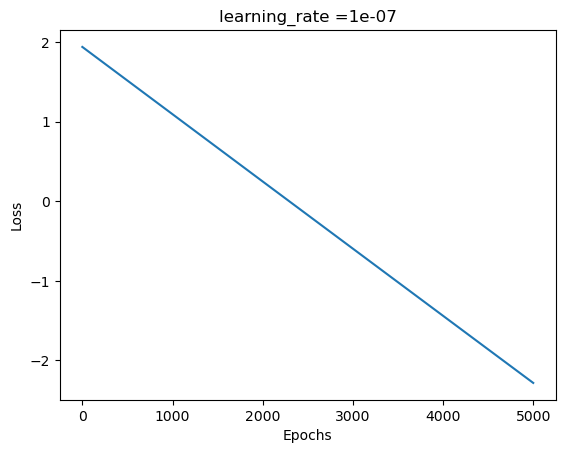

In [241]:
dataloader = load_csv("")

model = TwoLayer_NN(dims= [2, 10, 1], epochs=5000, learning_rate=1e-7)

model.fit(dataloader["X_train"].T,dataloader["Y_train"].T)

In [242]:
dataloader = load_csv("")
model = reg(hidden_layer_sizes=[25],
                         random_state=1, max_iter=10**6)

evaluate_fitting(dataloader= dataloader, model= model, loss=rmse)

Training fitting ...


/home/woreom/anaconda3/envs/ml-course/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1607: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



loss: 0.30041072944913383


Test fitting ...
loss: 0.8506147309140735
